# Exploratory Data Analysis

In [ ]:
# Import libraries

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium

In [2]:
# Notebook settings
pd.options.display.max_columns = None
%matplotlib inline
sns.set_style("darkgrid", {"grid.color": ".6"})


# Load data

In [3]:
water_pump_data = pd.read_csv('../data/processed/water_pump_dataset.csv')

display(water_pump_data.head(10))
print(f"dataframe shape: {water_pump_data.shape}")

,amount_tsh,funder,num_private,basin,region,district_code,lga,public_meeting,permit,construction_year,extraction_type_group,management,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,status_group,gps_height_new,population,longitude,latitude,year_recorded
0,6000.0,other,0,lake nyasa,iringa,5,ludewa,True,False,1999,gravity,vwc,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,functional,1390,109,34.938093,-9.856322,2011
1,0.0,other,0,lake victoria,mara,2,serengeti,not_available,True,2010,gravity,wug,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,functional,1399,280,34.698766,-2.147466,2013
2,25.0,other,0,pangani,manyara,4,simanjiro,True,True,2009,gravity,vwc,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,functional,686,250,37.460664,-3.821329,2013
3,0.0,unicef,0,ruvuma / southern coast,mtwara,63,nanyumbu,True,True,1986,submersible,vwc,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,non functional,263,58,38.486161,-11.155298,2013
4,0.0,other,0,lake victoria,kagera,1,karagwe,True,True,0,gravity,other,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,functional,369,200,31.130847,-1.825359,2011
5,20.0,other,0,pangani,tanga,8,mkinga,True,True,2009,submersible,vwc,per bucket,salty,salty,enough,enough,other,other,unknown,communal standpipe multiple,functional,369,1,39.172796,-4.765587,2011
6,0.0,dwsp,0,internal,shinyanga,3,shinyanga rural,True,True,0,swn 80,vwc,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,hand pump,non functional,369,428,33.362410,-3.766365,2012
7,0.0,rwssp,0,lake tanganyika,shinyanga,3,kahama,True,True,0,nira/tanira,wug,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,non functional,369,428,32.620617,-4.226198,2012
8,0.0,wateraid,0,lake tanganyika,tabora,6,tabora urban,True,True,0,india mark ii,vwc,never pay,salty,salty,seasonal,seasonal,machine dbh,borehole,groundwater,hand pump,non functional,369,150,32.711100,-5.146712,2012
9,0.0,other,0,lake victoria,kagera,1,karagwe,True,True,0,nira/tanira,vwc,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,functional,369,200,30.626991,-1.257051,2011


dataframe shape: (59400, 27)


In [4]:
# Get descriptive statistics
water_pump_data.describe()

,amount_tsh,num_private,district_code,construction_year,gps_height_new,population,longitude,latitude,year_recorded
count,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,317.650385,0.474141,5.629747,1300.652475,795.260572,278.015455,35.084144,-5.785140,2011.921667
std,2997.574558,12.236230,9.633649,951.620547,584.328013,461.120067,2.593799,2.825597,0.958758
min,0.000000,0.000000,0.000000,0.000000,-90.000000,1.000000,29.607122,-11.649440,2002.000000
25%,0.000000,0.000000,2.000000,0.000000,369.000000,100.000000,33.091138,-8.540621,2011.000000
50%,0.000000,0.000000,3.000000,1986.000000,369.000000,150.000000,34.908743,-5.022018,2012.000000
75%,20.000000,0.000000,5.000000,2004.000000,1319.250000,400.000000,37.178387,-3.326288,2013.000000
max,350000.000000,1776.000000,80.000000,2013.000000,2770.000000,30500.000000,40.345193,-0.998464,2013.000000


# Univariate analysis

The 'functional needs repair' group is very imbalanced. Might need to apply upsampling of minority group.

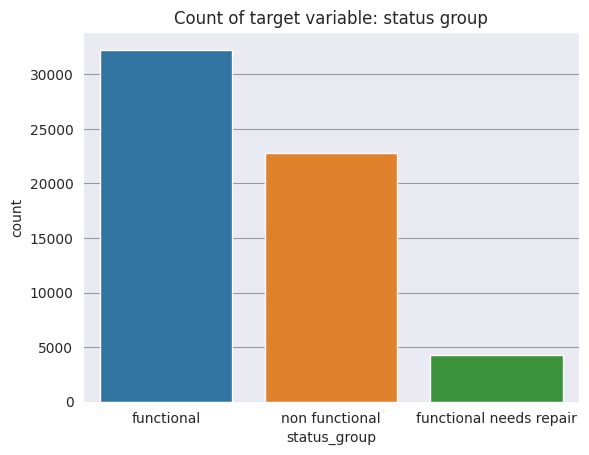

In [5]:
target = "status_group"
water_pump_data[target].unique()

plt.figure()
plt.title(f'Count of target variable: status group')
sns.countplot(x=water_pump_data['status_group'])
plt.show()


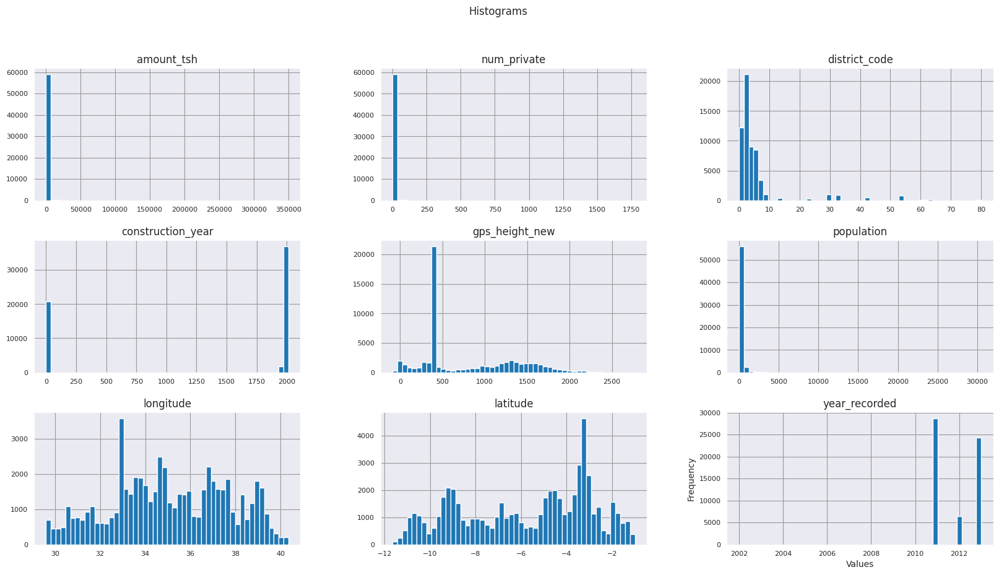

In [6]:
# plot histograms of the columns

cont_cols = list(water_pump_data.select_dtypes(include='number').columns)

water_pump_data.hist(column=cont_cols, bins=50, figsize=(20, 10), xlabelsize=8, ylabelsize=8)

# add a title and labels to the plot
plt.suptitle('Histograms')
plt.xlabel('Values')
plt.ylabel('Frequency')

# display the plot
plt.show()

In [7]:
# define a dictionary of colors for each category
colors = {
    'functional': 'green',
    'non functional': 'red',
    'functional needs repair': 'orange'
}


# create a map centered on Tanzania
m = folium.Map(location=[-6.3690, 34.8888], zoom_start=6, width=800)

# add markers for each city
for index, row in water_pump_data.sample(10_000).iterrows():
    color = colors[row['status_group']]
    folium.Circle(location=[row['latitude'], row['longitude']], tooltip=row['status_group'], color=color).add_to(m)

# Display the map
m

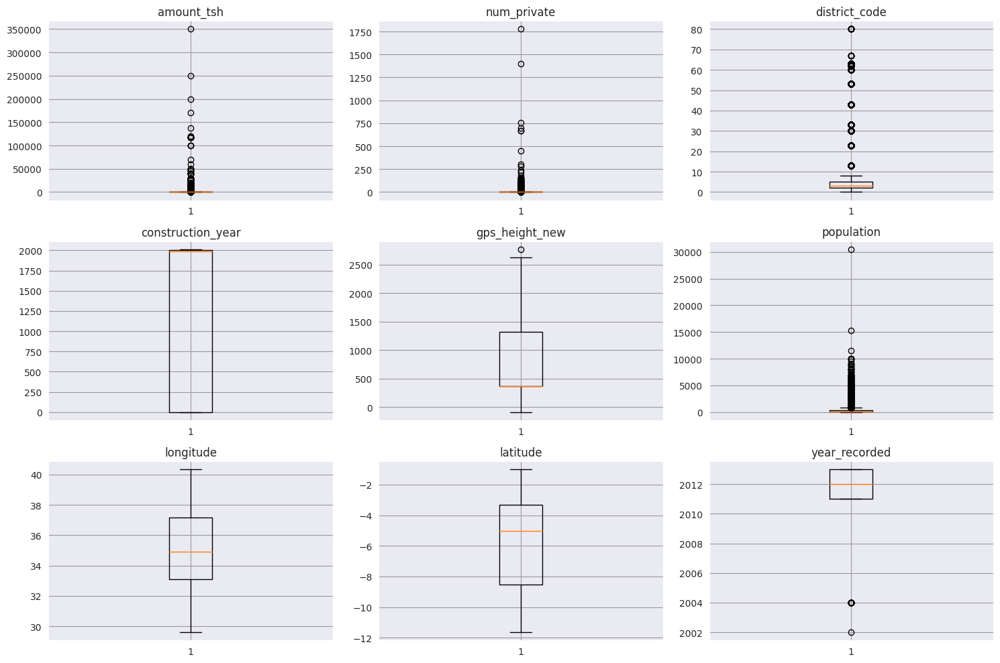

In [8]:
# plot the boxplots over two rows
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
for i, var in enumerate(cont_cols):
    ax = axs[i//3, i%3]
    ax.boxplot(water_pump_data[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

## Bivariate analysis

/tmp/ipykernel_6246/2752905737.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = water_pump_data.corr()


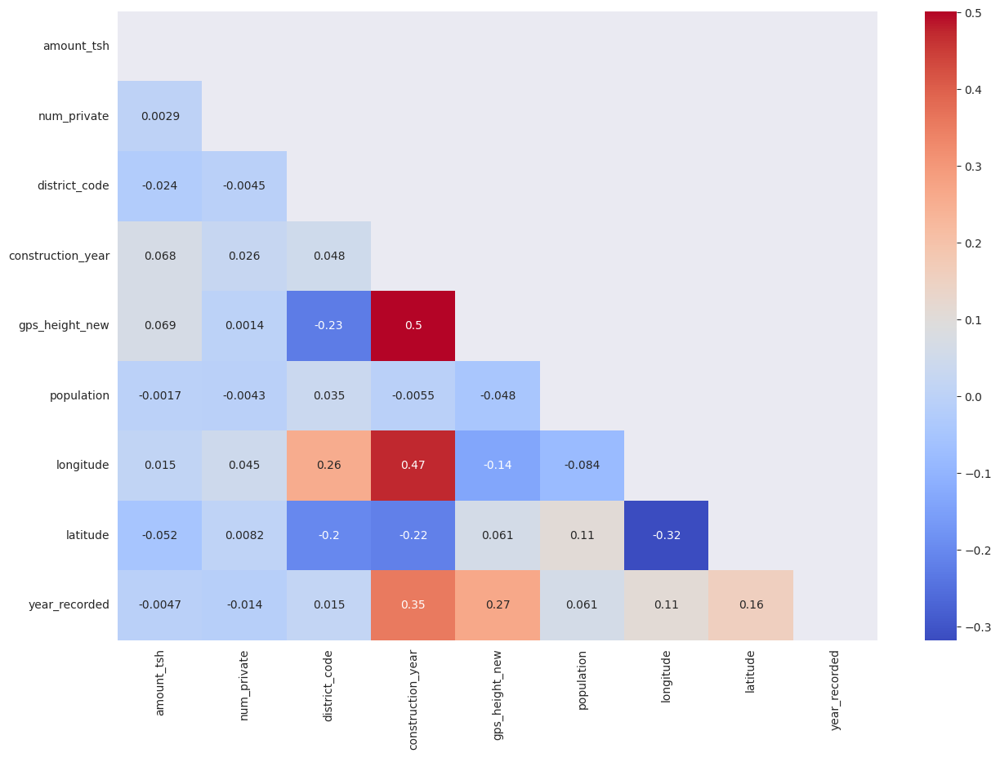

In [9]:
plt.figure(figsize=(15,10))

# calculate the correlation matrix
corr_matrix = water_pump_data.corr()

# create a boolean mask to hide the upper half
mask = np.zeros_like(corr_matrix)
mask[np.triu_indices_from(mask)] = True

# plot the correlation matrix with Seaborn
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, mask=mask)

plt.show()

In [10]:
# Select categorical columns with less than 20 categories
cat_cols = water_pump_data.select_dtypes(include=['object']).columns
plot_cols = [col for col in cat_cols if water_pump_data[col].nunique() < 15]

print(plot_cols)

['basin', 'public_meeting', 'permit', 'extraction_type_group', 'management', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'quantity_group', 'source', 'source_type', 'source_class', 'waterpoint_type', 'status_group']


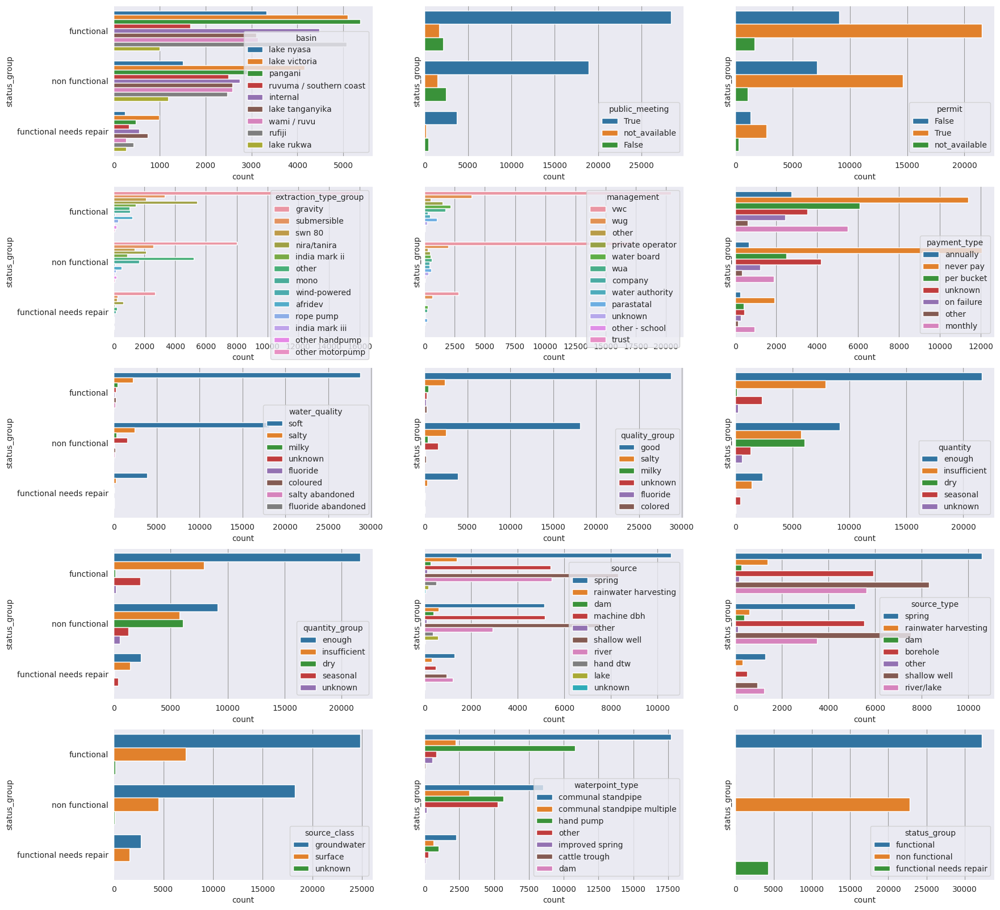

In [11]:
# Calculate the number of rows needed for the plots
num_rows = len(plot_cols) // 3 + (len(plot_cols) % 3 > 0)

# Create the subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 4*num_rows), sharey=True)
axes = axes.flatten()

for i, col in enumerate(plot_cols):

    sns.countplot(
        data=water_pump_data, y="status_group", hue=col, ax=axes[i],
    )
plt.show()